## This is a FSI problem of an articulated flag oscillating in a uniform flow

In [1]:
using Revise
using BSON: @save, @load

using Plots
pyplot()
default(grid = false)

In [2]:
using Pkg
Pkg.activate("..")
using FSInteraction

┌ Warning: /home/fs/.julia/packages/Plots/cc8wh/src/Plots.jl/ is not an existing directory, Revise is not watching
└ @ Revise /home/fs/.julia/packages/Revise/agmgx/src/Revise.jl:422


In [3]:
filename = "2dFlag";

## <span style="color:blue"> Set up rigid body with Dyn3d.jl

#### Include any joint-body setup script from Dyn3d

In [4]:
# problem dimension
ndim = 2
# numerical params
tf = 2
dt = 1e-3
scheme = "Liska"
st = 3
tol = 1e-4
num_params = NumParams(tf, dt, scheme, st, tol)
# gravity
gravity = [0., -0.5, 0.]

# set up system config info
config_system = ConfigSystem(ndim, gravity, num_params)

# set up bodys
nbody = 10
# config_body = ConfigBody(nbody)
config_body = ConfigBody(nbody, 4,
    [0. 0.; 1. 0.; 1. 1.0/nbody; 0. 1.0/nbody], 1.5)
config_bodys = fill(config_body, nbody)

# set up joints
njoint = nbody
stiff = 0.01
damp = 0.0
config_joints = Vector{ConfigJoint}(undef,njoint)
gap = 0.0

dof = Dof(3, "passive", stiff, damp, Motions())

config_joints[1] = ConfigJoint(njoint, "revolute",
    [0.,0.,-π/2+0.1*π,1.5,3.7,0.], zeros(Float64,6), 0, [dof], [0.0])

for i = 2:njoint
    config_joints[i] = ConfigJoint(njoint, "revolute", [0., 0., 0.0, 1.0/njoint+gap, 0., 0.],
        [0., 0., 0., -gap, 0., 0.], i-1, [dof], [0.0])
end

#### Build joint-body chain

In [5]:
bs, js, bsys = BuildChain(config_bodys, config_joints, config_system)
bd = BodyDyn(bs, js, bsys)

This is a 10 body-joint system, system is fixed in space

#### Initialize rigid body system state to complete body-joint information

In [6]:
bd, soln₀ = InitSystem!(bd);

#### Initialize u and λ container

In [7]:
qJ = soln₀.qJ
v = soln₀.v
λ_dim = bd.sys.ncdof_HERK
λ = zeros(Float64,λ_dim);

#### Get body verts for plotting

In [8]:
@get bd (bs, js, sys)
bs, js, sys = UpdatePosition!(bs, js, sys, soln₀.qJ)
vs₀ = VertsHistory(sys.nbody, bs);

#### Plot body only

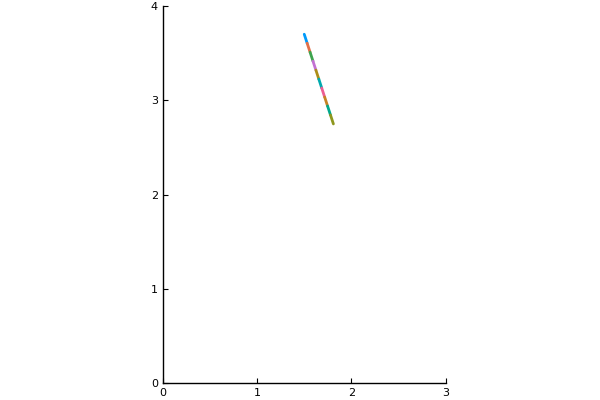

In [9]:
p = plot()
for i = 1:sys.nbody
    plot!(p,vs₀[i,2:3,1], vs₀[i,2:3,2],linewidth=2)
end
plot!(xlims=(0,3), ylims=(0,4), ratio=1, legend=false)

## <span style="color:blue"> Set up fluid with ViscousFlow.jl </span>

#### Set the flow parameters

In [10]:
Re = 200 # Reynolds number
U = -1.0 # Free stream velocity
U∞ = (0.0, U)

(0.0, -1.0)

#### Set the domain grid

In [11]:
nx = 302; ny = 402;
Ly = 4.0;
Δx = Ly/(ny-2);
Δt = min(0.5*Δx,0.5*Δx^2*Re)
w₀ = Nodes(Dual,(nx,ny))
xg, yg = coordinates(w₀,dx=Δx)

(-0.005:0.01:3.005, -0.005:0.01:4.005)

#### Set up fluid initial conditions

In [12]:
w₀ .= 0.0;
w = deepcopy(w₀);

## <span style="color:blue"> Create fluid-body interface </span>

#### Body in fluid plane

In [13]:
plane = [1,2];

#### Genrate body grid points and get linear velocity on them

In [14]:
bgs = GenerateBodyGrid(bd; np=DetermineNP(nbody, Δx))
bgs = CutOut2d(bd,bgs;gap=0.0);

#### Get body points initial coordinates for fluids

In [15]:
bgs = AcquireBodyGridKinematics(bd,bgs);

#### Set up body grid points and force container in fluid

In [16]:
X̃ = BodyGridToVectorData(bgs,"coord";plane=plane)
f = VectorData(X̃);

#### Create fluidstruct structure

In [17]:
tf = 1000Δt
T = Δt:Δt:tf
fsys = FluidStruct((nx,ny),Re,Δx,Δt,U∞ = U∞, X̃ = X̃, rk=RK31)
N = length(X̃)÷2

101

## <span style="color:blue"> Create ifherk object </span>

In [18]:
@time ifherk_coupled = IFHERK_coupled(fsys.Δt,bd,bgs,(w₀,qJ,v,f,λ),
                ((t,u) -> Systems.plan_intfact(t,u,fsys), B₁ᵀ, B₂),
                (M, G₁ᵀ, G₂, UpP, UpV),
                ((bd,bgs,f) -> T₁ᵀ(bd,bgs,f,fsys.Δx;plane=plane),
                 (bd,bgs,u) -> T₂(bd,bgs,u;plane=plane),
                 (bd,bgs) -> getX̃(bd,bgs;plane=plane)),
                ((w,t) -> FSInteraction.r₁(w,t,fsys), F, w -> U_inf(w,fsys), gti),
                fsys, tol=1e-3, rk=TimeMarching.RK31, bodydim=1)

 46.526330 seconds (42.81 M allocations: 5.901 GiB, 3.66% gc time)


Stage-3+ IF-HERK integrator with
   Time step size 0.005


In [19]:
fx = Float64[]
fy = Float64[]
t = 0.0
thist = []
whist = []
bdhist = BodyDyn[];

## <span style="color:blue"> TimeMarching! </span>

In [ ]:
@time for ti in T
    
    @time global t, (w, f), (qJ, v, λ), bd = ifherk_coupled(t, w, qJ, v, bd,fsys)
    
    push!(thist,t-Δt)
    push!(fx,sum(f.u)*Δx^2)
    push!(fy,sum(f.v)*Δx^2)
    push!(whist,deepcopy(w))
    push!(bdhist,deepcopy(bd))
    println("next time unit is $(round(t,digits=3))")
 
end

## <span style="color:blue"> Plot </span>

#### Set contour levels and fps

In [59]:
n = 15
contour_levels = range(-n*Δx,n*Δx,length=40)
clims = (-n*Δx,n*Δx)
sample_rate = 10
fps = 25;

#### Get body verts history

In [46]:
# get verts info based on this regular grid solution
vshist = []
for i = 1:length(bdhist)
    @get bdhist[i] (bs, js, sys)
    push!(vshist, VertsHistory(sys.nbody, bs))
end

#### Plot first and last time field

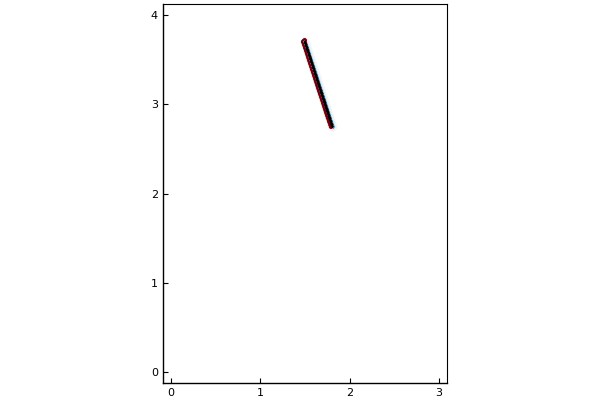

In [67]:
p = plot(xg,yg,whist[1],levels=contour_levels,color=:RdBu_10,clims=clims)
for i = 1:bd.sys.nbody
    plot!(p,vshist[1][i,2:3,1], vshist[1][i,2:3,2],linewidth=2,linecolor="black")
end
p

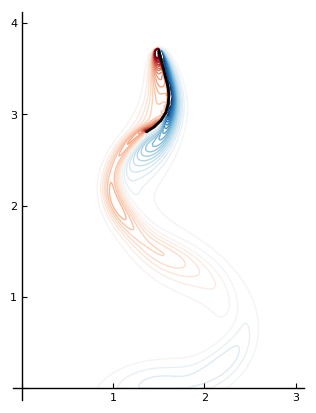

In [99]:
kk = 2*920
p = plot(xg,yg,whist[kk],levels=contour_levels,color=:RdBu_10,clims=clims,size=(300,400),framestyle=:origin)
for i = 1:bd.sys.nbody
    plot!(p,vshist[kk][i,2:3,1], vshist[kk][i,2:3,2],linewidth=2,linecolor="black")
end

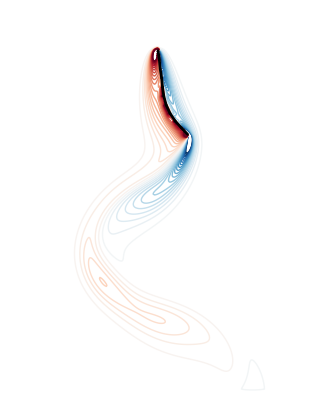

In [100]:
kk = 2*1000
p = plot(xg,yg,whist[kk],levels=contour_levels,color=:RdBu_10,clims=clims,size=(300,400),framestyle=:none)
for i = 1:bd.sys.nbody
    plot!(p,vshist[kk][i,2:3,1], vshist[kk][i,2:3,2],linewidth=2,linecolor="black")
end

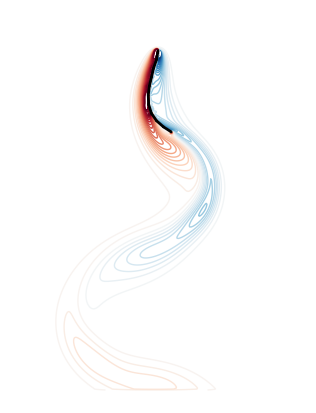

In [101]:
kk = 2*1080
p = plot(xg,yg,whist[kk],levels=contour_levels,color=:RdBu_10,clims=clims,size=(300,400),framestyle=:none)
for i = 1:bd.sys.nbody
    plot!(p,vshist[kk][i,2:3,1], vshist[kk][i,2:3,2],linewidth=2,linecolor="black")
end

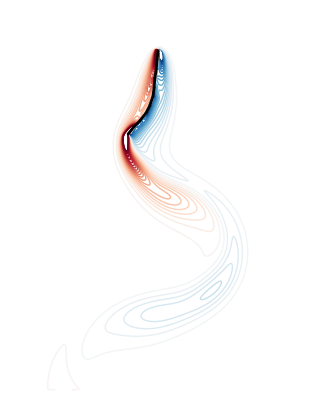

In [102]:
kk = 2*1160
p = plot(xg,yg,whist[kk],levels=contour_levels,color=:RdBu_10,clims=clims,size=(300,400),framestyle=:none)
for i = 1:bd.sys.nbody
    plot!(p,vshist[kk][i,2:3,1], vshist[kk][i,2:3,2],linewidth=2,linecolor="black")
end

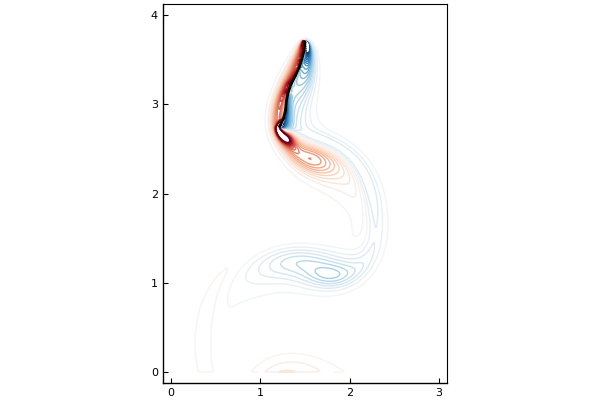

In [68]:
p = plot(xg,yg,whist[end],levels=contour_levels,color=:RdBu_10,clims=clims)
for i = 1:bd.sys.nbody
    plot!(p,vshist[end][i,2:3,1], vshist[end][i,2:3,2],linewidth=2,linecolor="black")
end

#### Body position begining and end

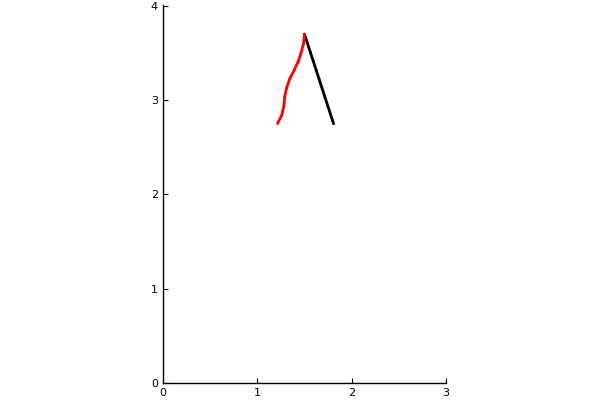

In [69]:
pb = plot()
for i = 1:sys.nbody
    plot!(pb,vshist[1][i,2:3,1], vshist[1][i,2:3,2],linewidth=2,linecolor="black",label="begin")
end
for i = 1:sys.nbody
    plot!(pb,vshist[end][i,2:3,1], vshist[end][i,2:3,2],linewidth=2,linecolor="red",label="end")
end
plot!(pb,xlims=(xg[1],xg[end]), ylims=(yg[1],yg[end]),ratio=1, legend=false)
pb

#### Make gif

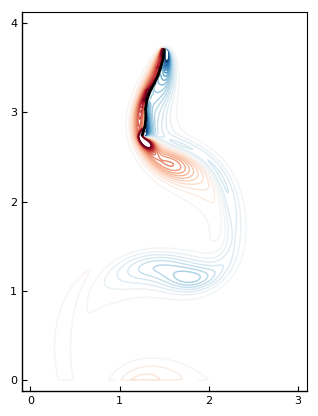

┌ Info: Saved animation to 
│   fn = /mnt/g/Research/FSI.jl/thesis/flapping flag/Huang_fig13.gif
└ @ Plots /home/fs/.julia/packages/Plots/cc8wh/src/animation.jl:98


Plots.AnimatedGif("/mnt/g/Research/FSI.jl/thesis/flapping flag/Huang_fig13.gif")
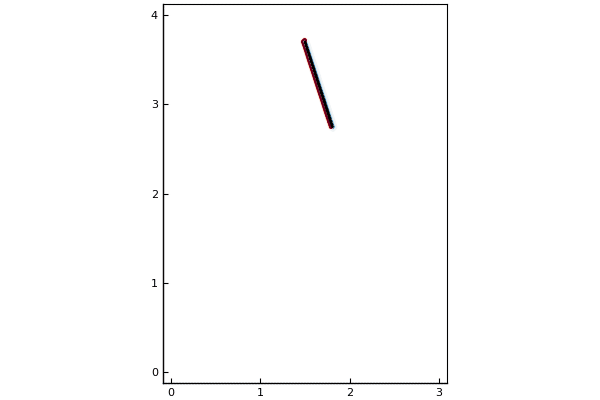

In [70]:
anim = @animate for j = 1:sample_rate:length(whist)
    plot(xg,yg,whist[j],levels=contour_levels,color=:RdBu_10,clims=clims)
    for i = 1:sys.nbody
        plot!(vshist[j][i,2:3,1], vshist[j][i,2:3,2],linewidth=2,linecolor="black")
    end
end

gif(anim, filename*".gif", fps = fps)

#### Tail trajectory

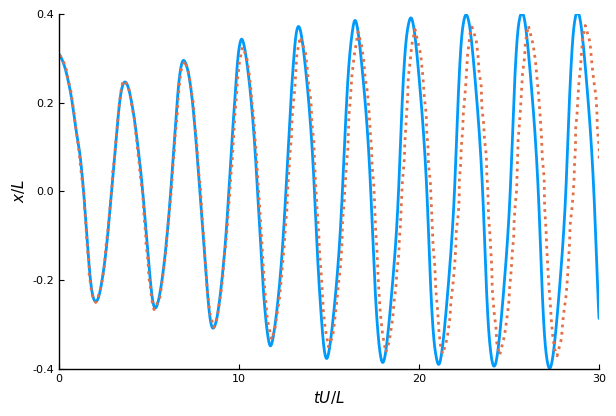

In [98]:
p10hist = []

for i in 1:length(bdhist)
    push!(p10hist,bdhist[i].bs[10].verts_i[3,1]-1.5)    
end

pp = plot(thist,p10hist,linewidth=2)
plot!(pp,legend=false,xlim=(0,30),ylim=(-0.4,0.4),xlabel="\$t U/L \$",ylabel="\$x/L\$")

#### Force history

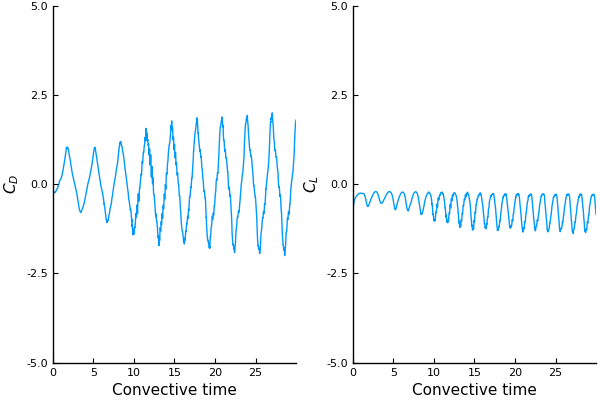

In [149]:
px = plot(thist,2*fx,xlim=(0,t),ylim=(-5,5),xlabel="Convective time",ylabel="\$C_D\$",legend=false)
py = plot(thist,2*fy,xlim=(0,t),ylim=(-5,5),xlabel="Convective time",ylabel="\$C_L\$",legend=false)
plot(px,py)

## <span style="color:blue"> Save Data </span>

#### Save all current data a .bson file

In [ ]:
# @save filename*".bson" bd bdhist xg yg whist vshist thist fx fy Δt w qJ v t f

#### Use the following block to extract data

In [ ]:
# using Dyn3d
# using ViscousFlow

# @load filename*".bson" bd bdhist xg yg whist vshist thist fx fy Δt w qJ v t f
# @get bd (bs,js,sys);

In [29]:
t

29.999999999998316